In [ ]:
from sklearn.svm import SVR
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import string
plt.style.use("fivethirtyeight")

In [ ]:
!git clone --depth=1 https://github.com/twintproject/twint.git

Cloning into 'twint'...
remote: Enumerating objects: 47, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 47 (delta 3), reused 14 (delta 0), pack-reused 0
Unpacking objects: 100% (47/47), done.


In [ ]:
cd twint

/content/twint/twint/twint/twint/twint/twint/twint/twint/twint


In [ ]:
!pip3 install . -r requirements.txt

Processing /content/twint/twint/twint/twint/twint/twint/twint/twint/twint
  Created wheel for twint: filename=twint-2.1.21-cp37-none-any.whl size=38872 sha256=9da6be4b56dec4c35e019a37fc712ecc63143422f0bc4a0b60783f01b54fe1b9
  Stored in directory: /tmp/pip-ephem-wheel-cache-jxuhqkgj/wheels/da/77/2c/0b2c247bac4d12621b8943fdc46a9d47ce01c40d6577cf1acb
Successfully built twint
  Found existing installation: twint 2.1.21
    Uninstalling twint-2.1.21:
      Successfully uninstalled twint-2.1.21


In [ ]:
!pip3 install twint

In [ ]:
import twint

In [ ]:
import nest_asyncio
nest_asyncio.apply()

In [ ]:
pwd

'/content/twint/twint/twint/twint/twint/twint/twint/twint/twint'

In [ ]:
cd twint

/content/twint/twint/twint/twint/twint/twint/twint/twint/twint/twint


In [ ]:
def get_twints(date1,date2,q):
  c = twint.Config()
  c.Search = q
  c.Lang = "en"
  # Custom output format
  c.Since = date1
  c.Until = date2
  c.Limit = 5000
  c.Pandas = True
  return twint.run.Search(c)


In [ ]:
def column_names():
  return twint.output.panda.Tweets_df.columns
def twint_to_pd(columns):
  return twint.output.panda.Tweets_df[columns]

In [ ]:
column_names()

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest'],
      dtype='object')

In [ ]:
def get_month(dt):
  s = dt[5:7]
  dt_obj = datetime.datetime.strptime(s,"%m")
  return dt_obj.strftime("%b")

In [178]:
get_twints('2021-06-01','2021-06-25','covaxin lang:en')
tweet_df_jun1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jun1["month"] = tweet_df_jun1["date"].apply(get_month)

get_twints('2021-06-01','2021-06-25','covidshield lang:en')
tweet_df_jun2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jun2["month"] = tweet_df_jun2["date"].apply(get_month)

get_twints('2021-06-01','2021-06-25','sputnik V lang:en')
tweet_df_jun3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jun3["month"] = tweet_df_jun3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1408175803242749955 2021-06-24 21:30:48 +0000 <DelhiUpdater> COVAXIN 2nd dose 110031 25-06-2021 24 slots Shahdara at GSSS Satsng Rajgrh Clny Site-1
1408175801502093312 2021-06-24 21:30:48 +0000 <VaccinateMumbai> COVAXIN 2nd dose 400607 25-06-2021 66 slots Thane at THANE Global Hub (18-44) 2
1408175794921230337 2021-06-24 21:30:46 +0000 <BloreVaccine> COVAXIN 2nd dose 560086 25-06-2021 48 slots BBMP at PRISTINE HOSPITAL COVAXIN
1408175789816778753 2021-06-24 21:30:45 +0000 <BloreVaccine> 560086 25-06-2021 1st dose: 123 slots COVAXIN BBMP at PRISTINE HOSPITAL COVAXIN
1408175712272453636 2021-06-24 21:30:27 +0000 <BloreVaccine> 560076 01-07-2021 1st dose: 393 slots COVAXIN BBMP at Rainbow Hospital BG Road C1
1408175701589561345 2021-06-24 21:30:24 +0000 <BloreVaccine> COVAXIN 2nd dose 560076 01-07-2021 61 slots BBMP at Rainbow Hospital BG Road C1
1408175641724293122 2021-06-24 21:30:10 +0000 <VizagVaccine> COVAXIN 2nd dose 530040 01-07-20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1408146462962114563 2021-06-24 19:34:13 +0000 <aman_bakoliya> I am feeling #feverish 🥵, As a #Shameless person I just want to feel it. Because I got my #1stdosecovid19vaccine , #COVIDSHIELD 😅. #VaccineForAll #GetVaccinated #CovidVaccine
1408144507200172032 2021-06-24 19:26:27 +0000 <honestwordonly> @NavroopSingh_ So #COVIDSHIELD vaccine are not ok ?
1408140572724891648 2021-06-24 19:10:49 +0000 <ayush45_> @whoshrey Take care bc Covidshield liya?
1408135320248348672 2021-06-24 18:49:56 +0000 <amooti_emma> @Snduhukire Which type of vaccine are we getting, covidshield?
1408130106673954816 2021-06-24 18:29:13 +0000 <Krishna_Insp> @NavroopSingh_ Ratio of vaccine administered is also 9:1 Covidshield and Covaxin. So efficacy is almost equal.
1408122655379578886 2021-06-24 17:59:37 +0000 <yaseen270918> @lkocmo  Sir In Lucknow can I get vacinated on Saturday in the Foreign Going 28 days Traveler category for Covidshield , please send me the name of center and contact number.
1408117387916808192

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1408152181958713348 2021-06-24 19:56:57 +0000 <CovidWiper> Today, We burned 2 billions CoWi🔥  #Covid19 #Vaccines #Biontech #CoronaVac #Health #Sputnik #Crypto  #Bitcoin #Ethereum #Binance #WHO  @WHO @BioNTech_Group  @pfizer  @sputnikvaccine  @moderna_tx  @AstraZeneca  https://t.co/3gxWYpCIn8
1408152165424697345 2021-06-24 19:56:53 +0000 <OCLANUS> @sandrililian @C5N @sputnikvaccine Troll sorete
1408151880635613191 2021-06-24 19:55:45 +0000 <Madhuc_Das> @PMOIndia Request to send more Covaxin or Sputnik V soon across all states bcoz 4 states have already been identified with Delta plus variant of COVID. To stop the 3rd wave from spreading we request u to necessary steps soon. Kids above 5 yrs should also be vaccinated soon.
1408151534500786176 2021-06-24 19:54:22 +0000 <nchrysoloras> Both Greece and Cyprus accept visitors inoculated with Sinopharm and the ⁦@sputnikvaccine⁩ without any quarantine requirements - Merkel and Macron made clear

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [179]:
get_twints('2021-05-01','2021-06-01','covaxin lang:en')
tweet_df_may1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_may1["month"] = tweet_df_may1["date"].apply(get_month)

get_twints('2021-05-01','2021-06-01','covidshield lang:en')
tweet_df_may2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_may2["month"] = tweet_df_may2["date"].apply(get_month)

get_twints('2021-05-01','2021-06-01','sputnik V lang:en')
tweet_df_may3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_may3["month"] = tweet_df_may3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1399448356691144705 2021-05-31 19:31:03 +0000 <CovidvaxDEL> West delhi has at least 502 new slots available between 31-05-21 &amp; 07-06-21. Covishield:502  Covaxin:0  18+:0  45+:502  Dose1:470  Dose2:32  Book one now at  https://t.co/oN1Ae9Fz77 #vaccine #cowin #covid #delhi
1399448348965281794 2021-05-31 19:31:01 +0000 <DebarghoB> @mybmc @CMOMaharashtra @rajeshtope11 @AslamShaikh_MLA @AUThackeray @mayor_mumbai @mybmcHealthDept @mybmcPHD @PIBMumbai What about 18-44 who have received 1st dose of covaxin. I and my wife received our 1st dose and our 2nd dose is due on 5th June. Are these walk-ins even for us.
1399447887122092033 2021-05-31 19:29:11 +0000 <mamunur1999> @RanjeetkrDass @shivathapa @LovlinaBorgohai Vaccine (covaxin) is not available for the age group of 18+ in Bongaigaon. Do something ASAP. Only 5-6 days left for second dose@CMOfficeAssam @RanjeetkrDass @himantabiswa
1399447845556523009 2021-05-31 19:29:01 +0000 <smjalageri> 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1399488843900878848 2021-05-31 22:11:56 +0000 <imrahulchoubey> Got my first dose of covidshield today!  Thank you @hyattkolkata @HospitalsApollo for this effort to ensure the safety and well-being of the team members during this tough time. Kudos!  #COVID19Vaccination #care #ApolloHospital
1399478028711829506 2021-05-31 21:28:57 +0000 <ANABEELAHAMAD1> @saudiexpat Please i am thanking you sir and eagerly waiting for your covidshield vaccine approval from Saudi Arabia Government video immediately with documented proof sir please
1399477465538457604 2021-05-31 21:26:43 +0000 <ANABEELAHAMAD1> @rjworld2020 Please i am thanking you and same waiting for your covidshield vaccine approval from Saudi Arabia Government video from your end once you gathered proof documented
1399455788968538116 2021-05-31 20:00:35 +0000 <Owaise13845707> I took my first jab of covidshield today .. after 6 hours I developed symptoms of high fever head and body ache... It's not reducing even after taking 2 #dolo650 pa

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1399442998031695875 2021-05-31 19:09:45 +0000 <johnnyjpmendes> @UN @BharatBiotech @sputnikvaccine @Sinovac @SerumInstIndia @pfizer @AstraZeneca @JanssenGlobal @moderna_tx @BioNTech_Group @Novavax @WHO @UNHumanRights Dear all, the world needs to be vaccinated against covid. Please, make the production and distribution of the covid-vaccines...
1399442862413058049 2021-05-31 19:09:13 +0000 <YuryGolovkov> Russia and UNICEF agree to supply Sputnik V vaccine  https://t.co/H3uo20KieC
1399441270486020097 2021-05-31 19:02:53 +0000 <AnkurSr19101901> Karnataka Rejects Bids To Supply Sputnik V, To Approach Vaccine Makers Directly  https://t.co/sNrgMg4rAF
1399438291640864769 2021-05-31 18:51:03 +0000 <mohitbharatiya_> Pfizer / Moderna - 🇺🇸 ( USA ) Sputnik V - 🇷🇺 ( Russia ) Covishield- 🇮🇳 🇬🇧 ( India &amp; UK ) Sinovac - 🇨🇳 ( China )  Covaxin- 🇮🇳 ( India )   Proud to be 🇮🇳 Indian ! This is #NewIndia 🇮🇳!  Thank You @narendramodi Ji for Making Nation S

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [180]:
get_twints('2021-04-01','2021-05-01','covaxin lang:en')
tweet_df_apr1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_apr1["month"] = tweet_df_apr1["date"].apply(get_month)

get_twints('2021-04-01','2021-05-01','covidshield lang:en')
tweet_df_apr2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_apr2["month"] = tweet_df_apr2["date"].apply(get_month)

get_twints('2021-04-01','2021-05-01','sputnik V lang:en')
tweet_df_apr3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_apr3["month"] = tweet_df_apr3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1388281999224307717 2021-04-30 23:59:56 +0000 <Rajali1910> #CovidIndia #CovidResources shortage are created by left leaning #UrbanNaxals ecosystems in #Indian soil 2 show us in poor light in global arena They couldn't digest india could give #CovishieldVaccine #Covaxin to the world Hence #IndiaNeedsOxygen toolkit unleased  #ramdesivir
1388281706180845569 2021-04-30 23:58:46 +0000 <pretty_punjabi_> 2021 so far ....  Jan - HNY, yayyy 2020 over 🎉   Feb - weddings, Maldives, and stepping out   March - Covidshield, Covaxin, 60+ 💉   April - RIP, OM Shanti 😞  Dear god, plz let the month of May for HOPE, HEAL, VACCINATED 🙏🏻💪🏻  #IndiaLetsGetVaccinated  #IndiaFightsBack
1388281453763391490 2021-04-30 23:57:46 +0000 <sanuoos> @latha_venkatesh #Covaxin is jointly developed by icmr &amp; NIV Pune. Govt has some hand on it.
1388281080046833665 2021-04-30 23:56:17 +0000 <PurpleRain713> @Oooooo_Donna @Dreamsicle2020 Actually India is using AstraZeneca

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1388281706180845569 2021-04-30 23:58:46 +0000 <pretty_punjabi_> 2021 so far ....  Jan - HNY, yayyy 2020 over 🎉   Feb - weddings, Maldives, and stepping out   March - Covidshield, Covaxin, 60+ 💉   April - RIP, OM Shanti 😞  Dear god, plz let the month of May for HOPE, HEAL, VACCINATED 🙏🏻💪🏻  #IndiaLetsGetVaccinated  #IndiaFightsBack
1388225543695306755 2021-04-30 20:15:36 +0000 <Harshit78262026> @TriLinga_ @TriLinga_ should we take covaxin if given ?? Coz u said Covidshield is better one ??
1388219168298725377 2021-04-30 19:50:16 +0000 <Sandeep040589> @DestinyFavChild @DigiThane @TMCaTweetAway Which Vaccine is being given at Diva Anjur, Covidshield or Covaxin
1388216371499003907 2021-04-30 19:39:09 +0000 <AllegedLowbrow> @rsv_muthu @ikkmurugan @iambossr My father-in-law got Covidshield in govt hospital....it was free....if you are opting for private hospital then you will have to pay
1388216317908447232 2021-04-30 19:38:56 +0000 <akshoyupal> @MajorPoonia This may create more confusion, pe

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1388256904380616705 2021-04-30 22:20:13 +0000 <jncatron> Brazilian agency’s decision to delay authorization is political, says Sputnik V team  https://t.co/KUPqa9Pvmx
1388256859555909632 2021-04-30 22:20:02 +0000 <kmr_ind> @PriyankaPulla Tag someone so it reaches then no! @ICMRDELHI @narendramodi @PMOIndia #SputnikV has many issues according to Brazilian Regulators who have rejected it. Please look into it before vaccinating 100 million Indians blindly with it
1388256562003779588 2021-04-30 22:18:51 +0000 <Mihrakcan> @LaOtra13 @tr19230 @sputnikvaccine What is the fake? And what i said negatively and you are defensive???  I am living in CIS and this is the my proof!..  You are really need some help!..
1388255909663723526 2021-04-30 22:16:16 +0000 <LaOtra13> @Mihrakcan @tr19230 @sputnikvaccine You repeat google news... Ok, thought you were serious! Go on with your fakes.
1388255887022645250 2021-04-30 22:16:10 +0000 <stevendwoodruff> See

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [181]:
get_twints('2021-03-01','2021-04-01','covaxin lang:en')
tweet_df_mar1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_mar1["month"] = tweet_df_mar1["date"].apply(get_month)

get_twints('2021-03-01','2021-04-01','covidshield lang:en')
tweet_df_mar2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_mar2["month"] = tweet_df_mar2["date"].apply(get_month)

get_twints('2021-03-01','2021-04-01','sputnik V lang:en')
tweet_df_mar3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_mar3["month"] = tweet_df_mar3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1377407017661333505 2021-03-31 23:46:38 +0000 <codekittyio> @kavitapmd @US_FDA How about #Covaxin? From @Ocugen &amp; @BharatBiotech? Ocugen is right here in Pennsylvania.  https://t.co/W18ILwH6cQ
1377406355548467201 2021-03-31 23:44:00 +0000 <Amy07330614> $OCGN people already leary of vaccine .. who the heck wants a $JNJ now after ingredient mix up LOL ..who wants a 6th toe??... No thanks!!! COVAXIN to the rescue only traditional vaccine!
1377405346499731459 2021-03-31 23:40:00 +0000 <IndianExpress> Bharat Biotech has an agreement to supply 20 million doses of Covaxin to the Brazilian government.   https://t.co/Adgn2ygIrH
1377402569849368578 2021-03-31 23:28:58 +0000 <Dharma2X> Dr. @Swamy39 jee :  ‘Covaxin has 81% efficacy’: Bharat Biotech phase 3 trial results 🍀💥  Hearty congrats to Bharat Biotech, makers of India's #1 indigenous Covid-19 vaccine!   https://t.co/wRAPmqjNHx
1377402139668934656 2021-03-31 23:27:15 +0000 <jrvaleve03> @M

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1377376568486457345 2021-03-31 21:45:39 +0000 <jasonfindlay76> @Fraserhealth so I had the Covidshield shot lot# 41207029, March 21 so in 4months what is going to happen im sure as he'll not having the 2nd 1 of this since it's been curbed for my age group now what are you guys doing for it replacement wehave to restart the inoculation proces
1377359439246716929 2021-03-31 20:37:35 +0000 <jasonfindlay76> @adriandix  Had the covidshield shot now what @adriandix  now it's been shelved for my age  so what do I do for the 2nd shot, forget getting the 2nd 1 of covishield and start over you need to address this issue
1377308057076699149 2021-03-31 17:13:24 +0000 <_Northernerd> Pfizer is leading vaccine battle in terms of quality but its not even allowed in India. We have the highly disputed covidshield, almost banned in Brazil Covaxin and.... Russian thingy.
1377302406598336513 2021-03-31 16:50:57 +0000 <sriarveen> @sumanthraman sir. will you  recommend covidshield for 25 year women health car

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1377359267695497216 2021-03-31 20:36:54 +0000 <worldnewsdotcom> #Russia registers world's first #Covid-19 #vaccine for animals  #SputnikV   https://t.co/xdWFj8Nytv  https://t.co/H3VqdBCPAd
1377358595210190848 2021-03-31 20:34:13 +0000 <OkoechL> @jumaf3 It's all about making money from vaccines  Gava contractors wanted to make a kill from #AstraZeneca Ruto guys imported #SputnikV to also make money. Someone soon importing Chinese #Sinopharm  https://t.co/SiJrPxmCFp
1377358209179000835 2021-03-31 20:32:41 +0000 <bngesu> @johnnjenga @StateHouseKenya @sputnikvaccine Business.
1377357533208178689 2021-03-31 20:30:00 +0000 <Ruptly> A new batch of 500,000 doses of #SputnikV vaccine against #Covid-19 arrived at the #MexicoCity airport from #Russia on Wednesday. #Mexico  https://t.co/m7uyMalLLe
1377356891085447168 2021-03-31 20:27:27 +0000 <personnelibre> Russia registers world’s first Covid-19 vaccine for cats &amp; dogs as makers of Sputnik V

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [182]:
get_twints('2021-02-01','2021-03-01','covaxin lang:en')
tweet_df_feb1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_feb1["month"] = tweet_df_feb1["date"].apply(get_month)

get_twints('2021-02-01','2021-03-01','covidshield lang:en')
tweet_df_feb2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_feb2["month"] = tweet_df_feb2["date"].apply(get_month)

get_twints('2021-02-01','2021-03-01','sputnik V lang:en')
tweet_df_feb3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_feb3["month"] = tweet_df_feb3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1366070621797457920 2021-02-28 16:59:51 +0000 <vsharma71> @jatinsapra @kejriwal_007 @FaheemYounus Sputnik V was controversial as they didn’t present any data at all, no peer review. Covaxin data for phase 1-2 available and peer reviewed for safety n immunogenicity. Talking of its sales worldwide, they just finalized a contract of 20 million with Brazil yesterday.
1366069980169601029 2021-02-28 16:57:18 +0000 <VMittal13> @GabbbarSingh are you that duffer indeed??   Questions were over covaxin which was approved without completing trials.   Exports are for covidshield which is proven and approved in much of the world.
1366069112502321156 2021-02-28 16:53:51 +0000 <IMeIMyselfI> @sarv131 @sumanthraman Covishield has been tested &amp; we know the efficacy. Covaxin has not been tested &amp; we don't know the results/efficacy.  I will take covishield tomorrow, if possible but won't take covaxin.  P.S. Even covishield isn't as good as Pfizer v

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1366112472629874691 2021-02-28 19:46:09 +0000 <patil_prashanth> @GabbbarSingh To some extent I agree with you!  My uncles &amp; aunts, all are doctors &amp; 60+ prefered Covaxin above Covidshield!  Left leaning media is creating this nonsense!
1366097729697447944 2021-02-28 18:47:34 +0000 <DrumLifeUSA> @GaryBetsy @ColleenHenley Congratulations, Dose 2! My wife @AbuelitaAndy did great. It was the Pfizer vaccine. I’m sure you’ll do great.   #BuildingBackBetter #VaccineUp #CovidShield #SpreadKindness
1366093048136933377 2021-02-28 18:28:58 +0000 <PreetReema> @FaheemYounus In india covidshield as well as Covaxin is available which is better or should we wait for the jhonson n jhonson to come to India which won’t happen in near future
1366085006502678529 2021-02-28 17:57:00 +0000 <piyush_mahamuni> @SidShirole Important question - Can my parents choose which Vaccine? They don’t want to take Covaxin as it’s phase 3 trials are not completely vetted. Covidshield is what they want. I’m sure many

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1366098809432940545 2021-02-28 18:51:51 +0000 <iddoctor> @Lenkaoxara @marta02289425 @Persident_of_US @doctoreebs @VincentRK @sputnikvaccine @TheLancet Again, to fix the flaws of sputnik. mRNA is the clear winner of the first round of covid vaccines. The next generation, if needed, is way beyond Russian science and is being developed in the United States.
1366098567253868550 2021-02-28 18:50:53 +0000 <_jorgenegon>  https://t.co/Xol68CBjqW  #CzechRepublic  #Russia 😷👍  Endelig et mandfolk som giver EU Fingeren   ‘It’s not about geopolitics, but human health’: Czech PM signals country could use Russian Sputnik V vaccine without EU approval   — RT World News  https://t.co/0ByUqqC2XB
1366098238781218816 2021-02-28 18:49:35 +0000 <ReformedPsycho> Russia's Sputnik V vaccine 'works well against UK variant'  https://t.co/txFhRRb1TW @MailOnline
1366097738564128770 2021-02-28 18:47:36 +0000 <ardabeel12> Wonder if ill take the Sputnik v's vaccine n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [183]:
get_twints('2021-01-01','2021-02-01','covaxin lang:en')
tweet_df_jan1 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jan1["month"] = tweet_df_jan1["date"].apply(get_month)

get_twints('2021-01-01','2021-02-01','covidshield lang:en')
tweet_df_jan2 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jan2["month"] = tweet_df_jan2["date"].apply(get_month)

get_twints('2021-01-01','2021-02-01','sputnik V lang:en')
tweet_df_jan3 = twint_to_pd(["tweet","date","nlikes"])
tweet_df_jan3["month"] = tweet_df_jan3["date"].apply(get_month)

Streaming output truncated to the last 5000 lines.
1355876569613479938 2021-01-31 13:52:19 +0000 <digiworldblog> Bharat Biotech applies for emergency use authorization of Covaxin in Philippines  https://t.co/iAcp6ilNrp
1355875206053695488 2021-01-31 13:46:54 +0000 <AdesewaJosh> Both countries won't immediately have enough to go round and while we wait for more, I do that 👆plus exercise😎, social distance, 😩😭, wash my hands 👐 and listen to health experts on @trtworld  #COVAX #COVAXIN #vaccinations #COVID19 #Titok
1355873529791709186 2021-01-31 13:40:15 +0000 <TibetPeople> @inquirerdotnet #Covaxin vs #Sinopharm lets #Philippines people to decide.  #FreeTibet #FreeHK #China #CCP #XiJinping #COVID19 #ChineseVirus #BatoSinopharm #HoldChinaAccountable #BoycottSinovac #BoycottSinopharm #VaccineMaitri #VaccineDiplomacy #ChinaLiedPeopleDied #UN #WHO #EU #US #UK #India  https://t.co/nJj6p38b4F
1355873460400996361 2021-01-31 13:39:58 +0000 <TheGopalan> @pavpil The pre orders for #COVAXIN are for a

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1355925938110824449 2021-01-31 17:08:30 +0000 <Savalgishweta> Vaccination Campaign,on its way......lagwa le ?? 💉 #JustAsking #Covaxin #Covidshield
1355910468750237700 2021-01-31 16:07:02 +0000 <ewanbirney> Looking beyond UK and EU perspective, the real unit of population to worry about is the world. It is great to see the large Serum Institute in India pumping out CovidShield (Ox/Az) vaccine, and I think all the Chinese vaccination pushes needs a second look at.
1355876924589965315 2021-01-31 13:53:44 +0000 <ManzuBasynet> Me waiting for chiils fever after getting vaccine ( covidshield)😋😆  https://t.co/wZcHaTTXMa
1355856001598017536 2021-01-31 12:30:36 +0000 <khadka_parashar> Not a Injection Lover !   Vaccinated  First Dose #COVIDSHIELD 4120-2-004 ✅  https://t.co/cE727OHOYN
1355835264728526848 2021-01-31 11:08:11 +0000 <dr_praveen03> #COVIDSHIELD vaccine, spent 36 hours after vaccination with body ache and fatigue (tolerable) which started around 6 hours after vaccination, sore arm last

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Streaming output truncated to the last 5000 lines.
1355958230623649793 2021-01-31 19:16:49 +0000 <TimesLIVE> Russia has begun supplying its Sputnik V Covid-19 vaccine to the rebel-controlled region of Donetsk in eastern Ukraine despite a ban by Kyiv, a local news outlet said on Sunday.  https://t.co/GQXXxvwjvL
1355957750304550919 2021-01-31 19:14:54 +0000 <etobian> @BogochIsaac I have relatives in a country that is using the Sputnik V vaccine. Have you seen its data? Is it safe? Should they take it? Any advice for them?
1355957140205301764 2021-01-31 19:12:29 +0000 <venda_empire> @News24 DD will take Sputnik V Russian Vaccine, after all Duduzane and the Russians saved his life.
1355956718577057803 2021-01-31 19:10:48 +0000 <RuairiTraderIRL> @DonnellyStephen Sputnik V please. Lets end this madness for once . I'll go first (MSc Bioscience )
1355955509455704074 2021-01-31 19:06:00 +0000 <drjahanpur> @dava_o_dole در همون سایت GAVI حداقل این فرضیه هست و  The Russian Sputnik V vaccine acknow

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [184]:
tweet_df_apr1.head()

,tweet,date,nlikes,month
0,#CovidIndia #CovidResources shortage are creat...,2021-04-30 23:59:56,0,Apr
1,"2021 so far .... Jan - HNY, yayyy 2020 over 🎉...",2021-04-30 23:58:46,0,Apr
2,@latha_venkatesh #Covaxin is jointly developed...,2021-04-30 23:57:46,0,Apr
3,@Oooooo_Donna @Dreamsicle2020 Actually India i...,2021-04-30 23:56:17,2,Apr
4,This is what they were looking for against sup...,2021-04-30 23:56:11,0,Apr


In [185]:
def dfs_concat(tweet_df_jan,tweet_df_feb,tweet_df_mar,tweet_df_apr,tweet_df_may,tweet_df_jun):
  frames = [tweet_df_jan,tweet_df_feb,tweet_df_mar,tweet_df_apr,tweet_df_may,tweet_df_jun]
  concated_df = pd.concat(frames)
  return concated_df

In [186]:
covaxin_df = dfs_concat(tweet_df_jan1,tweet_df_feb1,tweet_df_mar1,tweet_df_apr1,tweet_df_may1,tweet_df_jun1)
covidshield_df = dfs_concat(tweet_df_jan2,tweet_df_feb2,tweet_df_mar2,tweet_df_apr2,tweet_df_may2,tweet_df_jun2)
sputnik_df = dfs_concat(tweet_df_jan3,tweet_df_feb3,tweet_df_mar3,tweet_df_apr3,tweet_df_may3,tweet_df_jun3)


In [187]:
covaxin_df.head()

,tweet,date,nlikes,month
0,@walllstreetbets OCGN because they have a deal...,2021-01-31 23:48:52,1,Jan
1,@POTUS Should get #covaxin from India too. Tha...,2021-01-31 23:48:34,1,Jan
2,🧪 Vaccines used globally Covaxin: 🇮🇳 IN,2021-01-31 23:30:57,0,Jan
3,@tulanimamts @DrSJaishankar Pahle apni knowled...,2021-01-31 23:02:13,1,Jan
4,"this is what its going to take, for individual...",2021-01-31 22:55:46,0,Jan


In [188]:
sputnik_df.head()

,tweet,date,nlikes,month
0,Russia has begun supplying its Sputnik V Covid...,2021-01-31 23:56:55,3,Jan
1,@sputnikvaccine Where are phase III results?,2021-01-31 23:44:45,0,Jan
2,Top Texxhnology Number One ! 👨 #mytopfans #Y...,2021-01-31 23:42:42,0,Jan
3,"televised message. Bolivia, which has been try...",2021-01-31 23:31:09,0,Jan
4,NATO member Czech Republic says it's open to p...,2021-01-31 23:30:13,0,Jan


In [189]:
covaxin_df.shape[0]
covaxin_df["month"].value_counts()

Jun    5096
May    5089
Jan    5079
Feb    5059
Apr    5000
Mar    5000
Name: month, dtype: int64

In [190]:
sputnik_df.shape[0]
sputnik_df["month"].value_counts()

Mar    5097
Jan    5094
Feb    5086
Jun    5066
Apr    5062
May    5044
Name: month, dtype: int64

In [203]:
def tweet_cleaner(text):
    text = re.sub('@[^\s]+','',text) #remove handlers
    text = re.sub('#\S+','',text) # remove hashtags
    text = re.sub(r'RT[\s]*','',text)
    text = re.sub("https*\S+",'',text) # remove urls
    text = re.sub(r':w*','',text)
    text = re.sub(r'\s+',' ',text,flags = re.I) # Substituting multiple spaces with single space
    text = re.sub(r'\w*\d+\w*', '', text) # remove numbers
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text) # remove punctuations
    return text

In [204]:
covaxin_df['clean_tweets'] = covaxin_df['tweet'].apply(tweet_cleaner)
covidshield_df['clean_tweets'] = covidshield_df['tweet'].apply(tweet_cleaner)
sputnik_df['clean_tweets'] = sputnik_df['tweet'].apply(tweet_cleaner)

In [208]:
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'',text)

In [209]:
covaxin_df['clean_tweets'] = covaxin_df['clean_tweets'].apply(remove_emoji)
covidshield_df['clean_tweets'] = covidshield_df['clean_tweets'].apply(remove_emoji)
sputnik_df['clean_tweets'] = sputnik_df['clean_tweets'].apply(remove_emoji)

In [210]:
covidshield_df[['tweet','clean_tweets']]

,tweet,clean_tweets
0,"Vaccination Campaign,on its way......lagwa le ...",Vaccination Campaign on its way lagwa le ...
1,"Looking beyond UK and EU perspective, the real...",Looking beyond UK and EU perspective the real...
2,Me waiting for chiils fever after getting vacc...,Me waiting for chiils fever after getting vacc...
3,Not a Injection Lover ! Vaccinated First Do...,Not a Injection Lover Vaccinated First Dose ...
4,"#COVIDSHIELD vaccine, spent 36 hours after vac...",vaccine spent hours after vaccination with ...
...,...,...
2345,Government is actually beginning study to asse...,Government is actually beginning study to asse...
2346,#Vaccination in 2 hours time. Will be #COVIDSH...,in hours time Will be
2347,@PCMCSarathi Do we need take appointment for c...,Do we need take appointment for covidshield ...
2348,@drdagly My son (age 22) got his first vaccina...,My son age got his first vaccination today...


In [211]:
from textblob import TextBlob

def get_sentiment(text):
    
    analysis = TextBlob(text)
    sentiment_polarity = analysis.sentiment.polarity
    sentiment_subjectivity = analysis.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity == 0:
        sentiment_label = 'Neutral'
    else: sentiment_label = 'Negative'
    result = {'polarity':sentiment_polarity, 
              'subjectivity':sentiment_subjectivity, 
              'sentiment':sentiment_label}
    return result

In [212]:
covaxin_df['sentiment_results'] = covaxin_df['clean_tweets'].apply(get_sentiment)
covidshield_df['sentiment_results'] = covidshield_df['clean_tweets'].apply(get_sentiment)
sputnik_df['sentiment_results'] = sputnik_df['clean_tweets'].apply(get_sentiment)

In [216]:
covaxin_df = covaxin_df.join(pd.json_normalize(covaxin_df['sentiment_results']))
covidshield_df = covidshield_df.join(pd.json_normalize(covidshield_df['sentiment_results']))
sputnik_df = sputnik_df.join(pd.json_normalize(sputnik_df['sentiment_results']))

In [227]:
covaxin_df['sentiment'].value_counts()

Positive    15330
Neutral     11449
Negative     3544
Name: sentiment, dtype: int64

In [228]:
covidshield_df['sentiment'].value_counts()

Positive    5576
Neutral     5240
Negative    1556
Name: sentiment, dtype: int64

In [219]:
sputnik_df['sentiment'].value_counts()

Neutral     13567
Positive    12840
Negative     4042
Name: sentiment, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


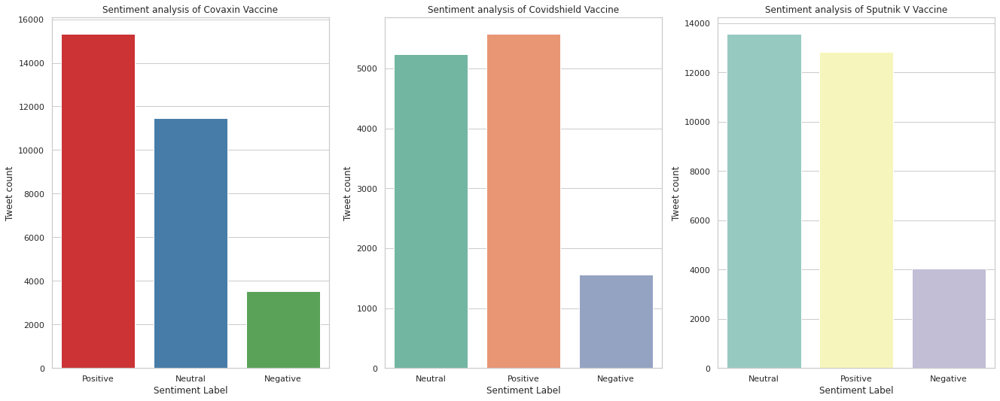

In [230]:
plt.figure(figsize=(20,8))
sns.set_theme(style="whitegrid")
plt.figure(1)
plt.subplot(131)
plt.title("Sentiment analysis of Covaxin Vaccine")
sns.countplot(covaxin_df['sentiment'],palette="Set1")
plt.xlabel('Sentiment Label')
plt.ylabel('Tweet count')
plt.xticks()
plt.subplot(132)
plt.title("Sentiment analysis of Covidshield Vaccine")
sns.countplot(covidshield_df['sentiment'],palette="Set2")
plt.xlabel('Sentiment Label')
plt.ylabel('Tweet count')
plt.xticks()
plt.subplot(133)
plt.title("Sentiment analysis of Sputnik V Vaccine")
sns.countplot(sputnik_df['sentiment'],palette="Set3")
plt.xlabel('Sentiment Label')
plt.ylabel('Tweet count')
plt.xticks()
plt.show()

In [231]:
sentiment_df1 = pd.DataFrame(covaxin_df[["polarity", "clean_tweets"]])
sentiment_df2 = pd.DataFrame(covidshield_df[["polarity", "clean_tweets"]])
sentiment_df3 = pd.DataFrame(sputnik_df[["polarity", "clean_tweets"]])

In [232]:
sentiment_df1 = sentiment_df1[sentiment_df1.polarity != 0]
sentiment_df2 = sentiment_df2[sentiment_df2.polarity != 0]
sentiment_df3 = sentiment_df3[sentiment_df3.polarity != 0]

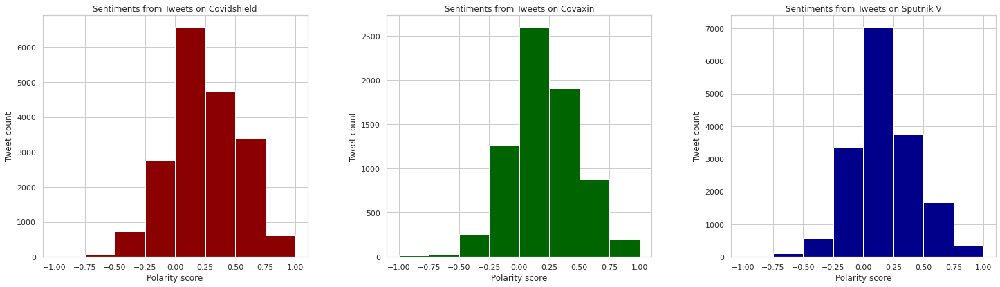

In [233]:
#f = plt.figure(figsize=(20,8))
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(22,6))


sentiment_df1.hist(bins=[-1, -0.75, -0.5, -0.25,0, 0.25, 0.5, 0.75, 1],ax =ax1,color="darkred")
ax1.set_title("Sentiments from Tweets on Covidshield")
ax1.set_xlabel('Polarity score')
ax1.set_ylabel('Tweet count')

sentiment_df2.hist(bins=[-1, -0.75, -0.5, -0.25,0, 0.25, 0.5, 0.75, 1],ax= ax2,color="darkgreen")
ax2.set_title("Sentiments from Tweets on Covaxin")
ax2.set_xlabel('Polarity score')
ax2.set_ylabel('Tweet count')

sentiment_df3.hist(bins=[-1, -0.75, -0.5, -0.25,0, 0.25, 0.5, 0.75, 1],ax = ax3,color="darkblue")
ax3.set_title("Sentiments from Tweets on Sputnik V")
ax3.set_xlabel('Polarity score')
ax3.set_ylabel('Tweet count')
plt.show()

In [236]:
covaxin_df['date'] = pd.to_datetime(covaxin_df['date']).dt.date
covidshield_df['date'] = pd.to_datetime(covidshield_df['date']).dt.date
sputnik_df['date'] = pd.to_datetime(sputnik_df['date']).dt.date

In [252]:
def set_time_line(df):
  timeline = df.groupby(['date', 'sentiment']).count().reset_index()
  timeline['count'] = timeline['tweet']
  timeline = timeline[['date', 'sentiment', 'count']]
  
  timeline = df.groupby(['date']).agg(np.nanmean).reset_index()
  timeline['count'] = df.groupby(['date']).count().reset_index()['nlikes']
  timeline = timeline[['date', 'count', 'polarity', 'nlikes','subjectivity']]
  timeline['polarity'] = timeline['polarity'].astype(float)
  timeline['subjectivity'] = timeline['subjectivity'].astype(float)
  return timeline

In [253]:
t1 = set_time_line(covaxin_df)
t2 = set_time_line(covidshield_df)
t3 = set_time_line(sputnik_df)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



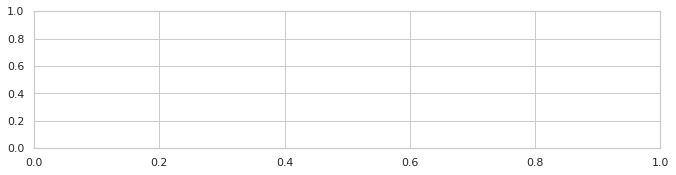

In [254]:
import plotly.express as px
plt.figure(figsize=(10,8))
plt.subplot(311)
fig = px.bar(t1, x='date', y='count', color='polarity',title = 'Covaxin')
fig.show()
plt.subplot(311)
fig = px.bar(t2, x='date', y='count', color='polarity',title = 'Covidshield')
fig.show()
plt.subplot(311)
fig = px.bar(t3, x='date', y='count', color='polarity',title = 'Sputnik V')
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



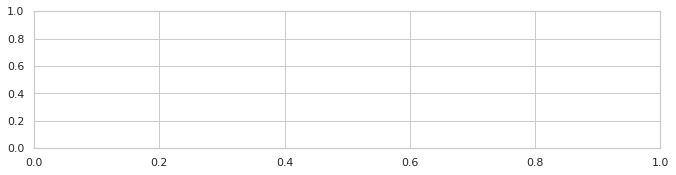

In [255]:
import plotly.express as px
plt.figure(figsize=(10,8))
plt.subplot(311)
fig = px.bar(t1, x='date', y='count', color='subjectivity',title = 'Covaxin')
fig.show()
plt.subplot(311)
fig = px.bar(t2, x='date', y='count', color='subjectivity',title = 'Covidshield')
fig.show()
plt.subplot(311)
fig = px.bar(t3, x='date', y='count', color='subjectivity',title = 'Sputnik V')
fig.show()